In this example, we will demonstrate how to generate synthetic data using diffusion models. Diffusion models are a class of generative models that have gained popularity in recent years due to their ability to generate high-quality data. They work by injecting noise into the original data and then fitting a model to learn how to reverse this process, effectively learning to generate new data from pure noise.


### Diffusion Models (SDE formulation)
In traditional diffusion models, the neural network is trained to predict the noise added to the data at discrete time steps. However, more recent approaches use a continuous-time formulation instead. This is achieved by modeling the diffusion process as a linear stochastic differential equation (SDE).

Before stating the equation, let's establish some notation. Throughout the library, we denote a functional dataset as $\{\mathbf{X}_i(t)\}_{i=1}^N$, where $\mathbf{X}_i(t)$ is the $i$-th function evaluated at $t$. Because we are modeling the evolution of the data over time, we will use $\tau$ to denote the time parameter in the SDEs to avoid confusion with the evaluation points, which are denoted by $t$. Additionally, since we are working with an `FDataGrid` we will use $\mathbf{X}$ to denote the vector obtained by evaluating the function at its grid points: $\mathbf{X} = \mathbf{X}(t_1), \mathbf{X}(t_2), \ldots, \mathbf{X}(t_m)$, where $t_1, t_2, \ldots, t_m$ are the grid points of the `FDataGrid`.

With this notation, the evolution of a sample function $\mathbf{X}$ can be described by the following SDE:

$$d\mathbf{X}(\tau) = \mathbf{f}(\tau) \mathbf{X}(\tau) d\tau + \mathbf{g}(\tau) d\mathbf{W}(\tau)$$

Here, $\mathbf{W}(\tau)$ is an $m$ dimensional independent standard Brownian motion, while $f(\tau)$ and $g(\tau)$ are functions that control the drift and diffusion of the process, respectively.

This process can be reversed using the reverse-time SDE, which allows us to generate new data by starting from pure noise and iteratively denoising it.

$$d\mathbf{X}(\tau) = [\mathbf{f}(\tau) \mathbf{X} - \mathbf{g}(\tau)^2 \nabla \log p_{\tau}(\mathbf{X})] d\tau + \mathbf{g}(\tau) d\mathbf{W}(\tau)$$

In this formulation, the neural network is trained to estimate the score function $\nabla \log p_\tau(\mathbf{X})$. For a deeper understanding of these methods, we recommend reading Yang Song's blog post, "Generative Modeling by Estimating Gradients of the Data Distribution" (https://yang-song.net/blog/2021/score/).


The most common choices for the functions $\mathbf{f(\tau)}$ and $\mathbf{g}(\tau)$ are:

- **Variance Preserving (VP)**: In this case, the functions are defined as follows:
$$\mathbf{f}(\tau) = -\frac{1}{2}\beta(\tau)\mathbf{I}$$
$$\mathbf{g}(\tau) = \sqrt{\beta(\tau)}\mathbf{I}$$

Here, $\beta(\tau)$ is a time-increasing function that controls the amount of noise added at each time step.
The most common schedules for $\beta(\tau)$ are **linear** and **cosine** schedules.
$$\text{Linear: } \quad \quad \beta(\tau) = \beta_{min} + \frac{\tau}{T}(\beta_{max} - \beta_{min}).$$

$$ \text{Cosine: } \quad \quad \beta(\tau) = \frac{\pi}{\tau(s+1)}\tan\left(\frac{\pi(s+\frac{\tau}{T})}{2(s+1)}\right).
$$

In the cosine schedule, $s$ is a hyperparameter that controls the minimum amount of noise.

This choice of $f(\tau)$ and $g(\tau)$ is not arbitrary: it ensures that the limiting distribution of the forward process is a standard Gaussian distribution, which can be beneficial for certain applications.

- **Variance Exploding (VE)**: Under this formulation, the drift term is set to zero
$$f(\tau) = 0$$

while the diffusion term $g(\tau)$ generally follows one of two common schedules:
$$\text{Linear: } \quad \quad g(\tau) = g_0 + \frac{\tau}{T}(g_T - g_0).$$
$$\text{Exponential: } \quad \quad g(\tau) = g_0 \left(\frac{g_T}{g_0}\right)^{\frac{\tau}{T}}.$$

In this scenario, the forward process exhibits a rapidly increasing variance, leading to a limiting distribution that theoretically has infinite variance.

In practice, the choice between VP and VE depends on the specific application and the underlying properties of the original data distribution.

### Example

In this example, we will implement a simple diffusion model utilizing both the VP and VE formulations.
We will use a convolutional neural network to estimate the score function and train it on the AEMET dataset, which contains daily temperature measurements from 73 Spanish weather stations. The goal is to generate synthetic meteorological data that accurately resembles the original data distribution.

First, we will load and plot the AEMET dataset.

Using device: cpu


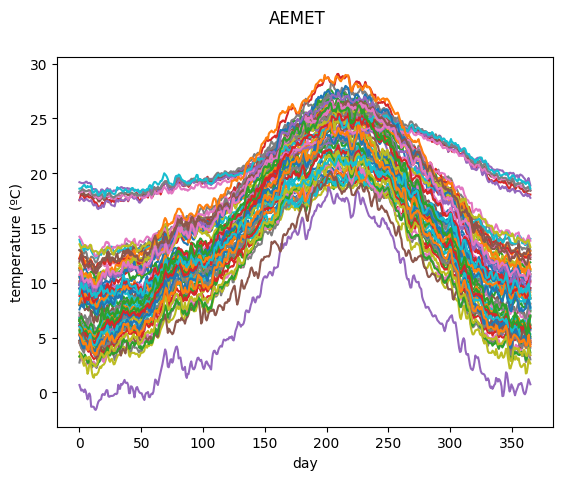

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch

from skfda.datasets import fetch_aemet

seed = 13

device = "cpu"

print(f"Using device: {device}")

X, y = fetch_aemet(return_X_y=True, as_frame=True)
fd_all = X.iloc[:, 0].array
fd = fd_all.coordinates[0]
n_points = len(fd.grid_points[0])
fd.plot()
plt.show()

Next, we define the Variance Preserving and Variance Exploding diffusion processes. Both will be initialized with their default parameters:
- **VP**: Cosine schedule with $\beta_{min} = 0.1$, $\beta_{max} = 10$.
- **VE**: Exponential schedule with $g_0 = 0.1$ and $g_T = 15$.

In [2]:
from skfda.ml.generative.diffusion_process import (
    VarianceExplodingDiffusionProcess,
    VariancePreservingDiffusionProcess,
)

vp_process = VariancePreservingDiffusionProcess(seed=seed)
ve_process = VarianceExplodingDiffusionProcess(seed=seed)


### Visualizing the Forward Process

Now that we have defined our Variance Preserving (VP) and Variance Exploding (VE) processes, let's visualize how they affect our data.

The animation below demonstrates the **forward diffusion process** over time, providing three distinct perspectives on how the data evolves:
- **Left Panel (Sample Evolution)**: Displays the transformation of a single functional data sample through both the VP and VE processes.
- **Center Panel (Data Heatmap)**: Shows a heatmap representing the evolution of all functional data points across the entire dataset.
- **Right Panel (Distribution Evolution)**: Illustrates how the overall distribution of values, $\{\mathbf{X}_i(\tau)\}$, shifts as noise is introduced.

As you play or step through the animation, you will observe the following:

- **Initial State ($\tau=0$)**: The process starts with the original, clean functional data (the AEMET meteorological curves).
- **Adding Noise**: As time progresses, the SDE incrementally injects Gaussian noise into the curves, and the structure of the original data becomes increasingly obscured.
- **VP vs. VE**: Pay attention to the scale and behavior of the noise. The VP process keeps the variance constrained (scaling the original data down as noise is added), eventually converging to a standard Gaussian distribution. The VE process, on the other hand, simply adds noise with an exponentially increasing variance, causing the scale of the data to explode.
- **Final State ($\tau=T$)**: By the end of the process, the original signal is completely destroyed, leaving only pure noise.

This forward process is exactly what our neural network will learn to reverse during training!

> **Note:** The diffusion process theoretically ensures that at each individual grid point $t_i$, the limiting distribution converges to a Gaussian (a standard Gaussian for VP, or an infinite-variance Gaussian for VE). The rightmost plot displays the aggregated distribution of all points combined. This aggregate also tends toward a Gaussian shape because a mixture of identical Gaussians remains Gaussian. To observe the pointwise convergence explicitly, refer to the center heatmap; examining any vertical slice reveals the Gaussian distribution forming at that specific $t_i$.

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import torch
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from scipy.stats import norm

from skfda.ml.generative.diffusion_process import ForwardDiffusionProcess

mpl.rcParams["animation.embed_limit"] = 100  # MB

# Generators: one for single-sample row, one for distribution row
torch_generator = torch.Generator(device).manual_seed(seed)
torch_generator_3d = torch.Generator(device).manual_seed(seed + 1)

n_frames = 25
torch_time_steps = torch.linspace(0.0, 1.0, n_frames, device=device)
fd_min = fd.data_matrix.min()
fd_max = fd.data_matrix.max()

scale = (fd_max - fd_min) / 2
bias = (fd_max + fd_min) / 2
fd_scaled = (fd - bias) / scale
torch_functions = torch.from_numpy(
    fd_scaled.data_matrix[..., 0],
).to(device).float()
n_samples = torch_functions.shape[0]
n_points = torch_functions.shape[-1]

rc("animation", html="jshtml")

process_names = ["VP", "VE"]
processes = [vp_process, ve_process]

# --- Layout: 2 rows x 3 cols (rows=process, cols=noise/heatmap/histogram) ---
fig, all_axes = plt.subplots(2, 3, figsize=(27, 10))
axes_2d = all_axes[:, 0]   # Col 0: single sample 2D lines
axes_hm = all_axes[:, 1]   # Col 1: heatmaps
axes_1d = all_axes[:, 2]   # Col 2: pooled histogram + limit distribution

# --- Col 0 setup: single sample 2D line plots ---
lines = []
x_data = np.asarray(fd.grid_points[0], dtype=float)
y_original = torch_functions[0].cpu().numpy()

for i, ax in enumerate(axes_2d):
    ax.plot(
        x_data, y_original,
        color="grey", alpha=1., linestyle="--", lw=2.,
        label="Original Data",
    )
    line, = ax.plot([], [], lw=2, color=f"C{i}")
    lines.append(line)
    ax.set_xlim(x_data[0], x_data[-1])
    ax.set_ylim(-1.6, 1.6)
    ax.set_xlabel("t")
    ax.set_title(f"Sample X_0(t) at τ=0.00 ({process_names[i]})")

# --- Col 1 setup: Heatmap distribution plots ---
n_y_bins = 50
y_bin_edges = np.linspace(-2, 2, n_y_bins + 1)
y_centers = 0.5 * (y_bin_edges[:-1] + y_bin_edges[1:])
torch_functions_scaled = torch_functions

vmax_hm = 10
Z_init = np.zeros((n_y_bins, n_points))
heatmaps = []
cmaps=["Blues", "Oranges"]
for i, ax in enumerate(axes_hm):
    hm = ax.pcolormesh(
        x_data, y_centers, Z_init,
        cmap=cmaps[i], shading="nearest",
        vmin=0, vmax=vmax_hm,
    )
    heatmaps.append(hm)
    ax.set_title(
        f"Distribution of X_i(t) at τ=0.00 ({process_names[i]})",
        fontsize=18,
    )
    fig.colorbar(hm, ax=ax, label="Samples per bin")

# --- Col 2 setup: pooled histogram + theoretical limit ---
hist_y_min_vp = -2.
hist_y_max_vp = 2.

scale_ve = torch.sqrt(
    ve_process._cov(torch.tensor([1.], device=device),
)).item()

hist_y_min_ve = -2
hist_y_max_ve =  2
hist_y_min = [hist_y_min_vp, hist_y_min_ve]
hist_y_max = [hist_y_max_vp, hist_y_max_ve]
hist_y_top = [1.5, 1.5]   # fixed upper y-limit per process (VP, VE)

pdf_y = [np.linspace(hist_y_min[i], hist_y_max[i], 200) for i in range(2)]
normal_pdfs = [
    norm.pdf(pdf_y[0], loc=0, scale=1),
    norm.pdf(pdf_y[1], loc=0, scale=scale_ve),
    ]
normal_names = ["N(0,1)", "N(0, ~inf)"]

# Pre-create all Col 2 artists — avoids ax.clear() + full redraw each frame
pooled_bin_edges = [
    np.linspace(hist_y_min[i], hist_y_max[i], 61) for i in range(2)
    ]

pooled_bars = []
hist_colors=["blue", "orange"]
for i, ax in enumerate(axes_1d):
    bw = pooled_bin_edges[i][1] - pooled_bin_edges[i][0]
    centers = 0.5 * (pooled_bin_edges[i][:-1] + pooled_bin_edges[i][1:])
    bars = ax.barh(
        y=centers, width=np.zeros(60), height=bw * 0.95,
        alpha=0.55, color=hist_colors[i], label="Samples",
    )
    pooled_bars.append(bars)

    # Plot the normal distribution limit curve
    ax.plot(
        normal_pdfs[i],
        pdf_y[i], color="red",
        lw=2.5,
        linestyle=":",
        label=normal_names[i],
    )

    ax.set_ylim(hist_y_min[i], hist_y_max[i])
    ax.set_xlim(0, hist_y_top[i])
    ax.set_ylabel("Value")
    ax.set_xlabel("Density")
    ax.legend(loc="upper right", fontsize=14)


def compute_distribution_heatmap(
        process: ForwardDiffusionProcess,
        t: torch.Tensor,
        gen: torch.Generator,
    ) -> tuple[np.ndarray, np.ndarray]:
    """Compute the 2D histogram heatmap for all samples at time t."""
    mean_at_t = process.mean_cond(torch_functions_scaled, t)
    noise = torch.randn(
        size=(n_samples, n_points), generator=gen, device=device,
    )
    noised = mean_at_t + process.multiply_sigma(noise, t.reshape(1))
    noised_rescaled = noised.cpu().numpy()

    # searchsorted on the FULL edge array → gives true bin index
    bin_idx = np.searchsorted(y_bin_edges, noised_rescaled, side="right") - 1
    # Out-of-range samples (below first edge or above last edge)
    out_mask = (bin_idx < 0) | (bin_idx >= n_y_bins)
    bin_idx[out_mask] = n_y_bins  # send to overflow bin

    z = np.apply_along_axis(
        lambda col: np.bincount(col, minlength=n_y_bins + 1)[:n_y_bins],
        0, bin_idx,
    ).astype(float)  # (n_y_bins, n_points)
    return z, noised_rescaled


# Precompute all per-frame data — moves all heavy
# work out of the animation loop
print("Precomputing frame data...", end=" ", flush=True)

col0_ydata   = [[None] * n_frames for _ in range(2)]
col1_z       = [[None] * n_frames for _ in range(2)]
col2_pooled  = [[None] * n_frames for _ in range(2)]

torch_single = torch_functions_scaled[0:1]
for frame in range(n_frames):
    t = torch_time_steps[frame]
    for i, process in enumerate(processes):
        # Col 0: single noised sample
        mean_at_t = process.mean_cond(torch_single, t)
        noise = torch.randn(
            size=(1, n_points), generator=torch_generator, device=device,
        )

        col0_ydata[i][frame] = (
            mean_at_t + process.multiply_sigma(noise, t.reshape(1))
        ).squeeze(0).cpu().numpy()
        # Col 1 + 2: full distribution
        z, noised = compute_distribution_heatmap(
            process, t, torch_generator_3d,
        )
        col1_z[i][frame] = z

        # Col 2: pooled histogram densities.
        # Divide by total count (including out-of-range values) so the
        # density matches the true PDF without clipping edge accumulation.
        _bw = pooled_bin_edges[i][1] - pooled_bin_edges[i][0]
        _counts, _ = np.histogram(noised.ravel(), bins=pooled_bin_edges[i])
        col2_pooled[i][frame] = _counts / (noised.ravel().shape[0] * _bw)

print("done.")


def update(frame: int) -> None:
    """Update artists with precomputed data, rendering only, no computation."""
    t = torch_time_steps[frame]
    for i in range(2):
        # Col 0
        lines[i].set_data(x_data, col0_ydata[i][frame])
        axes_2d[i].set_title(
            f"X_0(t) at τ={t.item():.2f} ({process_names[i]})", fontsize=18,
        )

        # Col 1
        heatmaps[i].set_array(col1_z[i][frame].ravel())
        axes_hm[i].set_title(
            f"Distribution of X_i(t) at τ={t.item():.2f} ({process_names[i]})",
            fontsize=18,
        )

        # Col 2: pooled bars
        for bar, h in zip(pooled_bars[i], col2_pooled[i][frame], strict=True):
            bar.set_width(h)
        axes_1d[i].set_title(
            f"Distributions at τ={t.item():.2f} ({process_names[i]})",
            fontsize=18,
        )


fig.tight_layout(h_pad=3.0)

anim = FuncAnimation(fig, update, frames=n_frames, interval=100)

plt.close()

anim

Precomputing frame data... done.


Due to the small size of the dataset (73 samples), we will train the model for 8000 iterations. The training time is around 10 minutes per model on a GPU. For that reason, we will load a pre-trained model. If you want to train your own model, set `train = True` — the training code is included below.

The score model is a `UNetScoreModel`: a 1-D convolutional U-Net that estimates the score function $\nabla \log p_\tau(\mathbf{X})$. The `kernel_sizes` parameter controls the receptive field at each encoder/decoder stage — larger kernels allow the network to capture longer-range dependencies across the evaluation grid.

In [4]:
from skfda.ml.generative.diffusion_model import (
    FunctionalDiffusionGenerator,
)
from skfda.ml.generative.score_model import UNetScoreModel

max_iter = 8000
normalize = True
standardize = False

load_trained_model = True
train = False
save_model = False
# Build the models under fork_rng for reproducibility
with torch.random.fork_rng():
    torch.manual_seed(seed)
    score_model_vp = UNetScoreModel(
        n_points=n_points,
        kernel_sizes=(21, 17, 9, 9),
        multiply_inv_sigma=vp_process.multiply_inv_sigma,
        device=device,
    )
    score_model_ve = UNetScoreModel(
        n_points=n_points,
        kernel_sizes=(21, 17, 9, 9),
        multiply_inv_sigma=ve_process.multiply_inv_sigma,
        device=device,
    )

vp_generator = FunctionalDiffusionGenerator(
    diff_process=vp_process,
    score_model=score_model_vp,
    max_iter=max_iter,
    normalize=normalize,
    standardize=standardize,
    seed=seed,
    device=device,
)
ve_generator = FunctionalDiffusionGenerator(
    diff_process=ve_process,
    score_model=score_model_ve,
    max_iter=max_iter,
    normalize=normalize,
    standardize=standardize,
    seed=seed,
    device=device,
)


In [5]:
if train:
     _ = vp_generator.fit(fd)
     _ = ve_generator.fit(fd)
     if save_model:
         vp_generator.save("./models/vp_vs_ve/vp_generator.pth")
         ve_generator.save("./models/vp_vs_ve/ve_generator.pth")
elif load_trained_model:
    vp_generator = FunctionalDiffusionGenerator.load(
        "./models/vp_vs_ve/vp_generator.pth", device=device,
    )
    ve_generator = FunctionalDiffusionGenerator.load(
        "./models/vp_vs_ve/ve_generator.pth", device=device,
    )
else:
    msg = (
        "You must choose either to train the generators ",
        "or to load pre-trained models.",
        )
    raise ValueError(msg)


In the following animation we show the reverse process for both the VP and VE models. For the reverse process, we compare two methods to reverse the forward SDE. The first one is using the reverse time SDE:
$$d\mathbf{X} = [\mathbf{f}(\tau) \mathbf{X} - \mathbf{g}(\tau)^2 \nabla \log p_\tau(\mathbf{X})] d\tau + \mathbf{g}(\tau) d\mathbf{W}(\tau)$$
The second one is using the probability flow ODE:
$$d\mathbf{X} = [\mathbf{f}(\tau) \mathbf{X} - \frac{1}{2}\mathbf{g}(\tau)^2 \nabla \log p_\tau(\mathbf{X})] d\tau$$
For each method, we use a numerical solver to integrate the corresponding SDE or ODE. In this example, we use the Euler-Maruyama method for the SDE and the 4th order Runge-Kutta method for the ODE.

In [6]:
from matplotlib import rc
from matplotlib.animation import FuncAnimation

from skfda.ml.generative.reverse_diffusion import (
     EulerMaruyamaIntegrator,
     ProbabilityFlowODEReverseProcess,
     RK4Integrator,
     SDEReverseDiffusionProcess,
)

# Compute the range of values for visualization limits
fd_min = fd.data_matrix.min()
fd_max = fd.data_matrix.max()

n_frames = 25
# More frames near τ=0 for smoother denoising visualization
timesteps = np.linspace(1.0, 0.0, n_frames+1)**3
n_samples_to_plot = 1  # Choose how many generated samples to visualize
# Use 10 sub-steps per frame: 25 frames x 10 steps = 250 function evaluations,
# equivalent to a 250-step integrator from τ=1 to τ=0.
f_data_evo_vp_em = vp_generator.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            n_steps=10,
            seed=seed,
            device=device,
            ),
        ),
    )
f_data_evo_vp_ode = vp_generator.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=ProbabilityFlowODEReverseProcess(
        RK4Integrator(n_steps=10),
        ),
    )
f_data_evo_ve_em = ve_generator.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            n_steps=10,
            seed=seed,
            device=device,
            ),
        ),
    )
f_data_evo_ve_ode = ve_generator.generate_evolution(
    timesteps=timesteps,
    n_samples=n_samples_to_plot,
    reverse_process=ProbabilityFlowODEReverseProcess(
        RK4Integrator(n_steps=10),
        ),
    )
f_data_evolutions = [[f_data_evo_vp_em, f_data_evo_vp_ode],
                     [f_data_evo_ve_em, f_data_evo_ve_ode],
                     ]
model_names = [
    ["Variance Preserving (SDE-EM)", "Variance Preserving (ODE-RK4)"],
    ["Variance Exploding (SDE-EM)", "Variance Exploding (ODE-RK4)"],
]

fig_gen, axes_gen = plt.subplots(2, 2, figsize=(12, 10))
rc("animation", html="jshtml")
# Extract grid points for plotting
x_data = f_data_evolutions[0][0][0].grid_points[0]

lines_per_ax = [[[] , []] , [[] , []]]
for row in range(2):
    for col in range(2):
        ax = axes_gen[row, col]
        for k in range(n_samples_to_plot):
            color = f"C{(k+row*n_samples_to_plot)%10}" # Cycle through colors
            line, = ax.plot([], [], lw=2, color=color, alpha=0.7)
            lines_per_ax[row][col].append(line)

        ax.set_xlim(x_data.min(), x_data.max())
        ax.set_ylim(fd_min, fd_max * 1.2)
        ax.set_xlabel("t")
        if row == 0:
            ax.set_ylabel("Generated Value")
        ax.set_title(f"{model_names[row][col]} at τ=1.000")

def update(frame: int) -> None:
    """Creation of each frame of the animation."""
    t = timesteps[frame]
    artists = []
    for row in range(2):
        for col in range(2):
            ax = axes_gen[row, col]
            current_fdata = f_data_evolutions[row][col][frame]
            y_data = current_fdata.data_matrix[..., 0]

            for j, line in enumerate(lines_per_ax[row][col]):
                line.set_data(x_data, y_data[j])
                artists.append(line)

            ax.set_title(f"{model_names[row][col]} at τ={t:.3f}")
    return artists

# Create the animation
anim = FuncAnimation(fig_gen, update, frames=n_frames, interval=100)

plt.close()
anim

Finally, we generate 73 synthetic samples using both the VP and VE models, and we compare them with the original data distribution.

In [7]:
n_gen_samples = 73
vp_generated = vp_generator.generate(
    n_gen_samples,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            seed=seed,
            device=device,
            ),
        ),
    )
ve_generated = ve_generator.generate(
    n_gen_samples,
    reverse_process=SDEReverseDiffusionProcess(
        EulerMaruyamaIntegrator(
            seed=seed,
            device=device,
            ),
        ),
    )

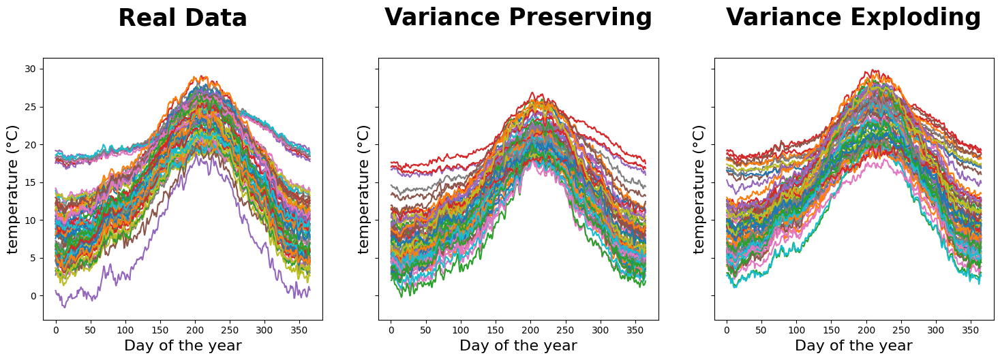

In [8]:
n_samples_to_plot = 73

# We plot the generated samples for both models.
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
fd.dataset_name = ""
fd[:n_samples_to_plot].plot(axes=axes[0])
vp_generated[:n_samples_to_plot].plot(axes=axes[1])
ve_generated[:n_samples_to_plot].plot(axes=axes[2])
axes[1].set_title("Variance Preserving\n", fontsize=25, fontweight="bold")
axes[2].set_title("Variance Exploding\n", fontsize=25, fontweight="bold")
axes[0].set_title("Real Data\n", fontsize=25, fontweight="bold")
for ax in axes:
    # delete ticks
    ax.set_ylabel("temperature (°C)", fontsize=16)
    ax.set_xlabel("Day of the year", fontsize=16)

plt.show()

As can be seen in the original data, there is a small cluster of samples with a slightly different behavior. They record higher temperatures especially in the winter months, corresponding to the stations at the Canary Islands. The VP model is more able to capture this cluster, while the VE model extends the distribution filling the space between the main cluster and the small cluster. In addition, neither model captures the sample with the lowest temperatures, which is expected since the edges of the distribution are the hardest to learn.